### This script process the precursors data frame created from the differential expression data and read counts to produce the sRNA accumulation profiles for melon pre-miRNAs

In [3]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt

In [4]:
final_table_precursors_counts_diff_exp = pd.read_csv('D://TFM/LLUIS/Results/08-sRNA_hairpin_alignment/20_01_20_precursors_table.csv', sep = ',')

In [5]:
final_table_precursors_counts_diff_exp

,Precursor,start,sRNA,ID,length prec,A,C,C_D,C_SA_SD,C_SA,...,MEAN-SD,SD-3,HSVd-1,HSVd-2,MEAN-HSVd,HSVd-3,MON-1,MON-2,MEAN-MON,MON-3
0,cme-MIR156j,64,GCTCACTTCTCTTTCTGTCAGTTT,SNCMel000000678,87,NaN,-2.038224,NaN,NaN,-1.924330,...,2.274846,2.601492,1.688627,1.635934,1.975351,2.760124,1.475143,1.104267,1.779845,2.429865
1,cme-MIR319a,161,TTGGACTGAAGGGAGCTCCCTTT,SNCMel000000981,189,NaN,-1.600201,-2.145447,NaN,-1.885873,...,5.784087,4.877797,14.634766,17.995277,12.502613,11.500519,5.654714,7.729870,8.295034,3.779789
2,cme-MIR396d,10,TTCCACAGCTTTCTTGAACTTT,SNCMel000001142,162,NaN,-4.601087,-4.210932,-4.450341,-5.096508,...,75.909384,65.687660,63.886380,56.985044,62.186362,82.803734,110.389848,91.102036,94.765206,69.656120
3,cme-MIR7129,5,GATACACGATCGTTTAGATTT,SNCMel000001321,62,NaN,-1.933565,-1.724976,NaN,-1.572198,...,4.466500,3.577051,2.814378,2.181246,2.857558,1.380062,5.408857,4.969202,3.919374,4.049774
4,cme-MIR156j,67,CACTTCTCTTTCTGTCAGTT,SNCMel000002352,87,NaN,NaN,NaN,-2.127789,-2.370354,...,2.336389,4.552610,1.125751,0.545311,2.074558,1.610073,2.458571,1.380334,1.816326,0.809955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376,cme-MIR398a,7,TGGTCGTCCTGAGAATACATGTCA,SNCMel000128390,100,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.407189,0.272656,0.839922,2.070093,NaN,NaN,2.070093,NaN
377,cme-MIR169a,128,TGACAGACTCTTTTCGATCATG,SNCMel000130794,365,NaN,NaN,NaN,NaN,NaN,...,2.217366,NaN,1.125751,3.817180,2.471466,3.910176,0.737571,0.828200,1.825316,1.889895
378,cme-MIR398a,5,CATGGTCGTCCTGAGAATACATG,SNCMel000130802,100,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.688627,0.545311,1.116969,2.760124,NaN,NaN,2.760124,NaN
379,cme-MIR398a,71,TGTGTTCTCAGGTCGCCCCTGC,SNCMel000131446,100,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.688627,0.545311,1.116969,1.380062,NaN,NaN,1.380062,NaN


### Add the size of the sequences (21-24 nt)?

In [6]:
sequences_list = final_table_precursors_counts_diff_exp['sRNA']
length_sequences = [len(i) for i in sequences_list]

In [7]:
final_table_precursors_counts_diff_exp.insert(value = length_sequences, column='length seq', loc=3)

In [8]:
final_table_precursors_counts_diff_exp.sort_values(by='Precursor')

,Precursor,start,sRNA,length seq,ID,length prec,A,C,C_D,C_SA_SD,...,MEAN-SD,SD-3,HSVd-1,HSVd-2,MEAN-HSVd,HSVd-3,MON-1,MON-2,MEAN-MON,MON-3
302,METC022194_319c,703,AACTGCCGACTCATTCACTCA,21,SNCMel000035967,990,NaN,2.833683,3.225126,1.819259,...,3.171292,8.454847,9.568885,5.453114,7.825616,9.200415,4.917142,1.380334,5.165964,3.509805
351,METC022194_319c,704,AACTGCCGACTCATTCACTC,20,SNCMel000063020,990,NaN,2.521189,2.691011,NaN,...,2.407859,4.227424,3.940129,3.544524,3.904026,5.290239,2.212714,2.484601,3.329185,2.969835
257,cme-MIR156a,10,TGACAGAAGAGAGTGAGCAC,20,SNCMel000031979,106,NaN,-1.708830,-1.278711,-1.596564,...,499.967991,476.072945,763.822184,823.965565,687.953564,621.028008,364.360256,355.297942,446.895402,557.518946
319,cme-MIR156a,10,TGACAGAAGAGAGTGAGCACA,21,SNCMel000037104,106,NaN,-2.116723,-1.558573,-1.836379,...,16.666042,22.112678,20.544959,24.811670,22.489769,19.090861,13.767999,12.423005,15.093955,18.088992
267,cme-MIR156b,11,TGACAGAAGATAGAGAGCAC,20,SNCMel000031985,182,NaN,-4.693371,-6.213818,-3.391558,...,2.062841,1.300746,10.131761,7.907016,6.446507,6.670301,2.704428,0.828200,3.400977,2.699850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,cme-MIR7130,7,AATGTGCGAGATGTGTGCGAGAT,23,SNCMel000053126,54,NaN,NaN,2.774388,NaN,...,0.438931,0.325186,0.844313,1.635934,0.935145,0.920041,0.245857,0.828200,0.664700,0.539970
100,cme-MIR858,7,CTCTCGTTGTCTGTTCGACCTTG,23,SNCMel000018897,164,NaN,NaN,1.151862,NaN,...,160.119584,64.061728,459.025049,614.020666,379.035814,343.865508,249.299123,294.839318,296.001316,241.906526
99,cme-MIR858,8,TCTCGTTGTCTGTTCGACCTTG,22,SNCMel000018896,164,NaN,NaN,NaN,NaN,...,124.997851,99.507050,453.114855,705.632985,419.418297,397.457925,174.804415,254.257502,275.506614,291.853744
98,cme-MIR858,9,CTCGTTGTCTGTTCGACCTTG,21,SNCMel000018895,164,NaN,-4.644010,-2.468747,-2.604169,...,0.739122,0.000000,2.814378,5.453114,2.755831,1.840083,1.966857,1.656401,1.821114,2.159880


### Filter: Keep the precursors where 2 regions are recognized to be sRNA generators

In [9]:
final_table_precursors_counts_diff_exp['%length'] = [None]*len(final_table_precursors_counts_diff_exp)
final_table_precursors_counts_diff_exp['5P or 3P'] = [None]*len(final_table_precursors_counts_diff_exp)
counter_5P = 0
counter_3P = 0

In [10]:
for element in range(len(final_table_precursors_counts_diff_exp)):
    #print(perc)
    perc = float(list(final_table_precursors_counts_diff_exp['start'])[element]) / float(
        list(final_table_precursors_counts_diff_exp['length prec'])[element])
    final_table_precursors_counts_diff_exp['%length'].iloc[element,] = perc
    if perc <= 0.5:
        final_table_precursors_counts_diff_exp['5P or 3P'].iloc[element,] = '5P'
        counter_5P += 1
    else:
        final_table_precursors_counts_diff_exp['5P or 3P'].iloc[element,] = '3P'
        counter_3P += 1

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:576: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value


In [11]:
final_table_precursors_counts_diff_exp

,Precursor,start,sRNA,length seq,ID,length prec,A,C,C_D,C_SA_SD,...,HSVd-1,HSVd-2,MEAN-HSVd,HSVd-3,MON-1,MON-2,MEAN-MON,MON-3,%length,5P or 3P
0,cme-MIR156j,64,GCTCACTTCTCTTTCTGTCAGTTT,24,SNCMel000000678,87,NaN,-2.038224,NaN,NaN,...,1.688627,1.635934,1.975351,2.760124,1.475143,1.104267,1.779845,2.429865,0.735632,3P
1,cme-MIR319a,161,TTGGACTGAAGGGAGCTCCCTTT,23,SNCMel000000981,189,NaN,-1.600201,-2.145447,NaN,...,14.634766,17.995277,12.502613,11.500519,5.654714,7.729870,8.295034,3.779789,0.851852,3P
2,cme-MIR396d,10,TTCCACAGCTTTCTTGAACTTT,22,SNCMel000001142,162,NaN,-4.601087,-4.210932,-4.450341,...,63.886380,56.985044,62.186362,82.803734,110.389848,91.102036,94.765206,69.656120,0.0617284,5P
3,cme-MIR7129,5,GATACACGATCGTTTAGATTT,21,SNCMel000001321,62,NaN,-1.933565,-1.724976,NaN,...,2.814378,2.181246,2.857558,1.380062,5.408857,4.969202,3.919374,4.049774,0.0806452,5P
4,cme-MIR156j,67,CACTTCTCTTTCTGTCAGTT,20,SNCMel000002352,87,NaN,NaN,NaN,-2.127789,...,1.125751,0.545311,2.074558,1.610073,2.458571,1.380334,1.816326,0.809955,0.770115,3P
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376,cme-MIR398a,7,TGGTCGTCCTGAGAATACATGTCA,24,SNCMel000128390,100,NaN,NaN,NaN,NaN,...,1.407189,0.272656,0.839922,2.070093,NaN,NaN,2.070093,NaN,0.07,5P
377,cme-MIR169a,128,TGACAGACTCTTTTCGATCATG,22,SNCMel000130794,365,NaN,NaN,NaN,NaN,...,1.125751,3.817180,2.471466,3.910176,0.737571,0.828200,1.825316,1.889895,0.350685,5P
378,cme-MIR398a,5,CATGGTCGTCCTGAGAATACATG,23,SNCMel000130802,100,NaN,NaN,NaN,NaN,...,1.688627,0.545311,1.116969,2.760124,NaN,NaN,2.760124,NaN,0.05,5P
379,cme-MIR398a,71,TGTGTTCTCAGGTCGCCCCTGC,22,SNCMel000131446,100,NaN,NaN,NaN,NaN,...,1.688627,0.545311,1.116969,1.380062,NaN,NaN,1.380062,NaN,0.71,3P


In [12]:
unique_prec = set(final_table_precursors_counts_diff_exp['Precursor']) ## list of unique precursors
precursors_2_regions = list()

for precursor in unique_prec:
    subset_prec = final_table_precursors_counts_diff_exp[final_table_precursors_counts_diff_exp['Precursor'] == precursor]
    column_5P_3P = list(subset_prec['5P or 3P'])
    if '3P' in column_5P_3P and '5P' in column_5P_3P: ## Looks for precursors with sRNAs at both 5P and 3P regions
        precursors_2_regions.append(precursor)

In [13]:
## Create the subset of precursors with these 2 regions:
precursor_2_reg = pd.merge(pd.DataFrame(precursors_2_regions, columns = ['Precursor']), 
                           final_table_precursors_counts_diff_exp, how= 'left')

In [14]:
len(precursor_2_reg)

285

In [13]:
## Write the table
precursor_2_reg.to_csv('D://TFM/LLUIS/Results/08-sRNA_hairpin_alignment/tablas/19_09_25_precursors_2_regions.csv', 
                       sep = ',', index = None)

## Analysis by families

### How many sequences are 21-nt long? And 24?

In [15]:
# length precursors_2_regions = 602 rows
lengths_sRNA = list(precursor_2_reg['length seq'])

In [16]:
print('There are', lengths_sRNA.count(20), '20-nt long sRNAs')
print('There are', lengths_sRNA.count(21), '21-nt long sRNAs')
print('There are', lengths_sRNA.count(22), '22-nt long sRNAs')
print('There are', lengths_sRNA.count(23), '23-nt long sRNAs')
print('There are', lengths_sRNA.count(24), '24-nt long sRNAs')
print('There are', lengths_sRNA.count(25), '25-nt long sRNAs')

There are 76 20-nt long sRNAs
There are 116 21-nt long sRNAs
There are 59 22-nt long sRNAs
There are 17 23-nt long sRNAs
There are 15 24-nt long sRNAs
There are 2 25-nt long sRNAs


### Number of precursor families

In [17]:
precursor_families = list()
for i in set(precursor_2_reg.loc[:,'Precursor']):
    if re.findall(r"[a-z]*", i[-1])[0] != '':  # this module supports regular expression patterns
        precursor_families.append(i[:-1])
    else:
        precursor_families.append(i)

In [18]:
print('There are', len(set(precursor_families)), 'families of precursors')

There are 16 families of precursors


In [18]:
set(precursor_families)

{'cme-MIR156',
 'cme-MIR159',
 'cme-MIR160',
 'cme-MIR166',
 'cme-MIR167',
 'cme-MIR168',
 'cme-MIR169',
 'cme-MIR171',
 'cme-MIR319',
 'cme-MIR390',
 'cme-MIR393',
 'cme-MIR395',
 'cme-MIR396',
 'cme-MIR397',
 'cme-MIR398',
 'cme-MIR408',
 'cme-MIR477'}

**_Broad response_**: miR156, miR167, miR319, miR393, miR396, miR408

**_Intermediate response_**: miR159, miR166, miR168, miR169, miR171, miR397, miR398

**_Narrow response_**: miR160, miR390 (tasi??), miR395

### Example with one precursor family (cme-MIR396)

In [19]:
precursor_cme = 'cme-MIR169a'

In [20]:
rows_precursor = set([prec for prec in list(precursor_2_reg['Precursor']) if precursor_cme in prec])

In [21]:
precursor_2_reg[precursor_2_reg.loc[:,'Precursor'] == precursor_cme]

,Precursor,start,sRNA,length seq,ID,length prec,A,C,C_D,C_SA_SD,...,HSVd-1,HSVd-2,MEAN-HSVd,HSVd-3,MON-1,MON-2,MEAN-MON,MON-3,%length,5P or 3P
103,cme-MIR169a,10,TAGCCAAAAATGACTTGCCTGT,22,SNCMel000006436,365,NaN,-7.136722,-3.928708,-3.757422,...,5.065880,8.724983,4.813745,3.450156,5.900571,5.797402,5.049376,2.429865,0.0273973,5P
104,cme-MIR169a,10,TAGCCAAAAATGACTTGCCTG,21,SNCMel000020230,365,NaN,-3.877598,-6.128143,-3.665522,...,5.065880,2.726557,2.597479,2.300104,1.966857,1.932467,2.066476,1.349925,0.0273973,5P
105,cme-MIR169a,255,TAGCCAAAAATGACTTGCCTG,21,SNCMel000020230,365,NaN,-3.877598,-6.128143,-3.665522,...,5.065880,2.726557,2.597479,2.300104,1.966857,1.932467,2.066476,1.349925,0.69863,3P
106,cme-MIR169a,255,TAGCCAAAAATGACTTGCCTGC,22,SNCMel000027549,365,NaN,-4.255263,-3.548955,-4.236378,...,12.383263,10.088261,9.333231,9.890446,8.604999,12.146938,10.214128,18.628962,0.69863,3P
107,cme-MIR169a,128,TGACAGACTCTTTTCGATCATG,22,SNCMel000130794,365,NaN,NaN,NaN,NaN,...,1.125751,3.817180,2.471466,3.910176,0.737571,0.828200,1.825316,1.889895,0.350685,5P


In [22]:
cmels_mir408 = precursor_2_reg.loc[precursor_2_reg['Precursor'].isin(rows_precursor)]

In [23]:
cmels_mir408
## Creo que no hay muchos casos con mismatches (he pasado de 200 rows a 83)

,Precursor,start,sRNA,length seq,ID,length prec,A,C,C_D,C_SA_SD,...,HSVd-1,HSVd-2,MEAN-HSVd,HSVd-3,MON-1,MON-2,MEAN-MON,MON-3,%length,5P or 3P
103,cme-MIR169a,10,TAGCCAAAAATGACTTGCCTGT,22,SNCMel000006436,365,NaN,-7.136722,-3.928708,-3.757422,...,5.065880,8.724983,4.813745,3.450156,5.900571,5.797402,5.049376,2.429865,0.0273973,5P
104,cme-MIR169a,10,TAGCCAAAAATGACTTGCCTG,21,SNCMel000020230,365,NaN,-3.877598,-6.128143,-3.665522,...,5.065880,2.726557,2.597479,2.300104,1.966857,1.932467,2.066476,1.349925,0.0273973,5P
105,cme-MIR169a,255,TAGCCAAAAATGACTTGCCTG,21,SNCMel000020230,365,NaN,-3.877598,-6.128143,-3.665522,...,5.065880,2.726557,2.597479,2.300104,1.966857,1.932467,2.066476,1.349925,0.69863,3P
106,cme-MIR169a,255,TAGCCAAAAATGACTTGCCTGC,22,SNCMel000027549,365,NaN,-4.255263,-3.548955,-4.236378,...,12.383263,10.088261,9.333231,9.890446,8.604999,12.146938,10.214128,18.628962,0.69863,3P
107,cme-MIR169a,128,TGACAGACTCTTTTCGATCATG,22,SNCMel000130794,365,NaN,NaN,NaN,NaN,...,1.125751,3.817180,2.471466,3.910176,0.737571,0.828200,1.825316,1.889895,0.350685,5P


In [24]:
#cmels_mir408.to_csv('prova_mir408.csv')

### TABLA PERFIL ACUMULACIÓN DOBLES Y TRIPLE

In [25]:
length_col = [i for i in range(1, cmels_mir408['length prec'].iloc[0]+1)] ## for desde 1 hasta 134 (len prec.)

In [26]:
column_names = ['CONTROL', 'C', 'C_D', 'C_SA_SD', 'C_SA', 'C_SD', 'D', 'D_MON', 'D_SA', 'SA', 'SD']

Para obtener los valores de la tabla, de cuentas totales en cada base (posición), **sumamos** todas las cuentas que aparecen en esa base. Para conseguirlo, para cada sRNA que alinea con el precursor, sumamos al rango de 21 a 24 nt que mide, el valor de sus cuentas.

Ahora creamos el dataframe final, vacío

In [27]:
base_to_base_prec_dataframe = pd.DataFrame(index=length_col, columns=column_names)
base_to_base_prec_dataframe = base_to_base_prec_dataframe.fillna(0)

Lo empezamos a llenar con datos de cuentas. Seleccionamos las columnas del dataframe de donde cogemos los datos, aquellas que contengan *Mean*

In [28]:
mean_counts_names = [x for i,x in enumerate(cmels_mir408.columns) if 'MEAN' in x]

In [29]:
mean_counts_names.insert(0,'start')
mean_counts_names.insert(1,'length seq')
mean_counts_names

['start',
 'length seq',
 'MEAN-CONTROL',
 'MEAN-AGRO',
 'MEAN-C',
 'MEAN-C_D',
 'MEAN-C_SA_SD',
 'MEAN-C_SA',
 'MEAN-C_SD',
 'MEAN-D',
 'MEAN-D_MON',
 'MEAN-D_SA',
 'MEAN-SA',
 'MEAN-SD',
 'MEAN-HSVd',
 'MEAN-MON']

Hacemos un subset del dataframe de datos para coger esas columnas

In [30]:
data = cmels_mir408[mean_counts_names]

Cambiamos el nombre de las columnas para que sean las mismas que en el dataframe vacío

In [31]:
new_colnames = [x[5:] for i,x in enumerate(cmels_mir408.columns) if 'MEAN' in x]

In [32]:
mean_counts_names[2:] = new_colnames

In [33]:
data.columns = mean_counts_names

Añadimos los datos al dataframe

In [34]:
for row in range(len(data)):
    start_pos = int(list(data.iloc[row,:])[0])
    end_pos = start_pos + int(list(data.iloc[row,:])[1])
    for base in range(start_pos, end_pos):
        print(base)
        base_to_base_prec_dataframe.iloc[base-1] = base_to_base_prec_dataframe.iloc[base-1].fillna(0) + data.iloc[row][mean_counts_names[2:]].fillna(0)

10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149


In [35]:
base_to_base_prec_dataframe = base_to_base_prec_dataframe.fillna(0) # cambiamos NA por 0

In [36]:
base_to_base_prec_dataframe

,CONTROL,C,C_D,C_SA_SD,C_SA,C_SD,D,D_MON,D_SA,SA,SD
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
361,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
362,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
363,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
364,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


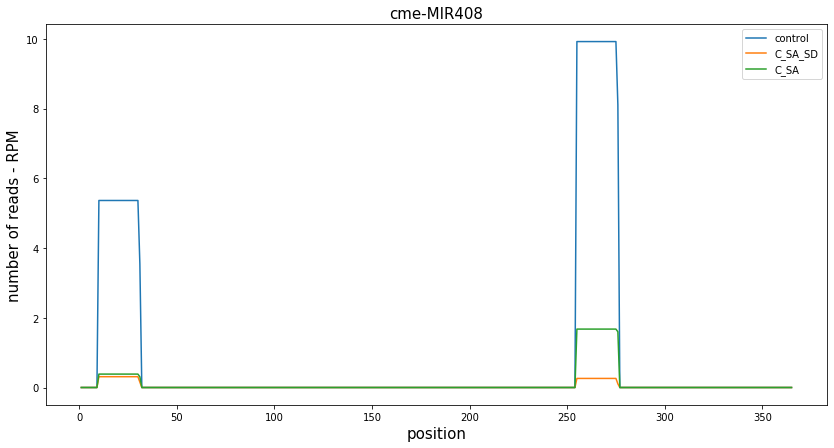

In [37]:
plt.figure(figsize = (14,7))
#for i in base_to_base_prec_dataframe.columns:
     #plt.plot(base_to_base_prec_dataframe.loc[:,i], label = i)
plt.plot(base_to_base_prec_dataframe.loc[:,'CONTROL'], label = 'control')
plt.plot(base_to_base_prec_dataframe.loc[:,'C_SA_SD'], label = 'C_SA_SD')
plt.plot(base_to_base_prec_dataframe.loc[:,'C_SA'], label = 'C_SA')
plt.title('cme-MIR408', fontsize = 15)
plt.xlabel('position', fontsize = 15)
plt.ylabel('number of reads - RPM', fontsize = 15)
#plt.ylim(0,100)
plt.legend()
plt.savefig('hola.jpg')
#plt.tight_layout()

In [38]:
base_to_base_prec_dataframe

,CONTROL,C,C_D,C_SA_SD,C_SA,C_SD,D,D_MON,D_SA,SA,SD
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
361,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
362,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
363,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
364,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Vamos a aplicar lo mismo en bucle para todos los 42 precursores con dos regiones

In [39]:
list_precursors = set(list(precursor_2_reg['Precursor']))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


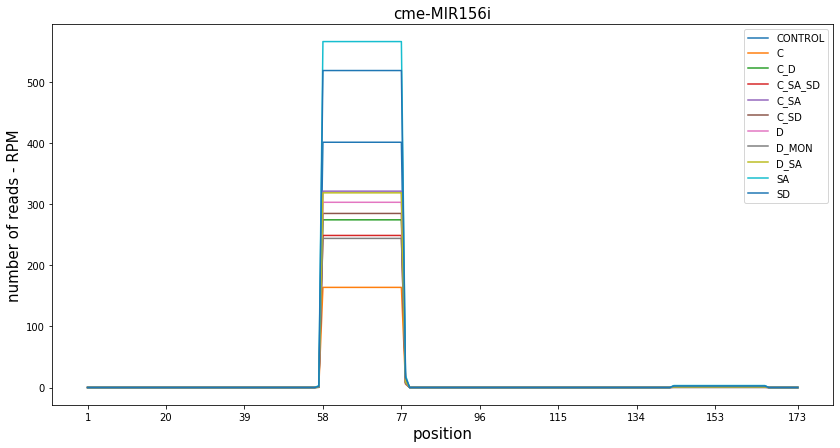

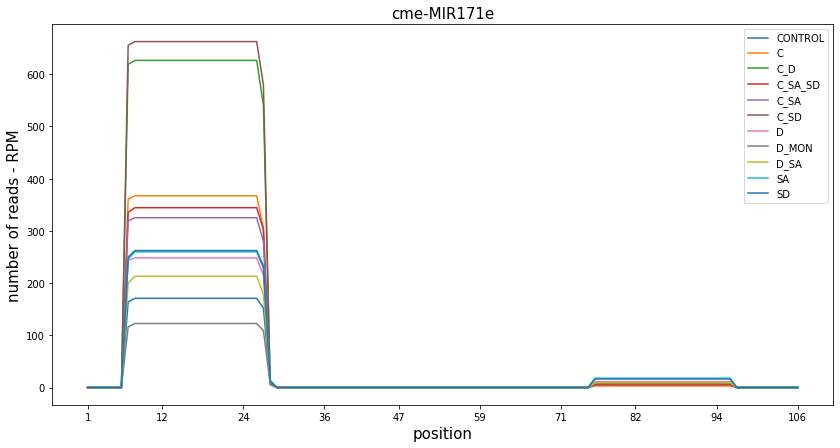

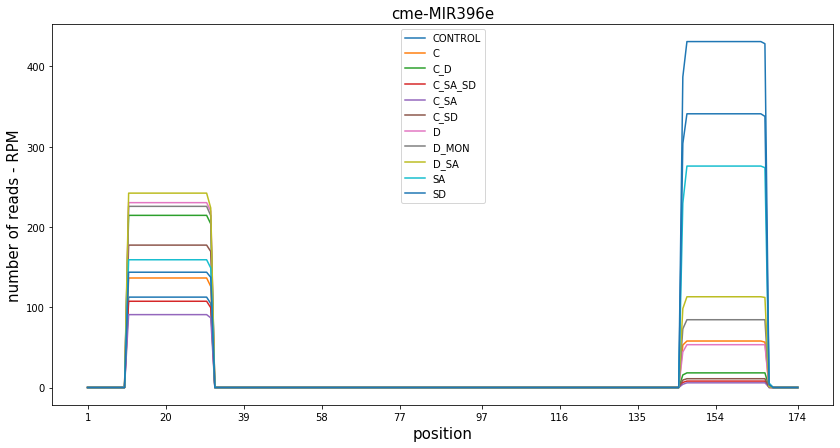

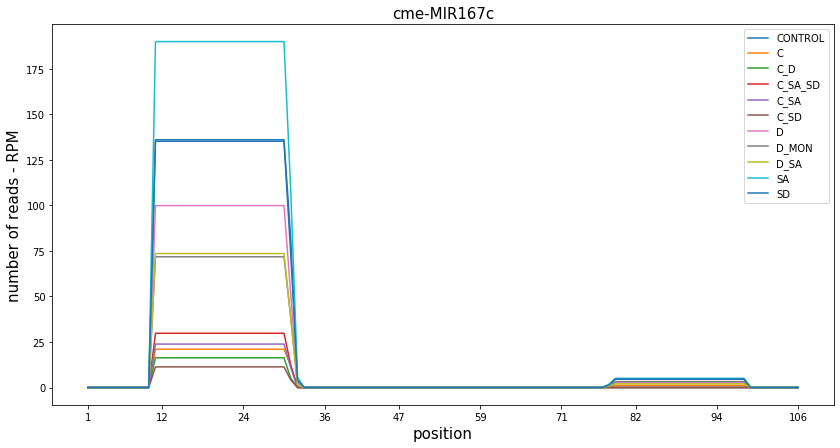

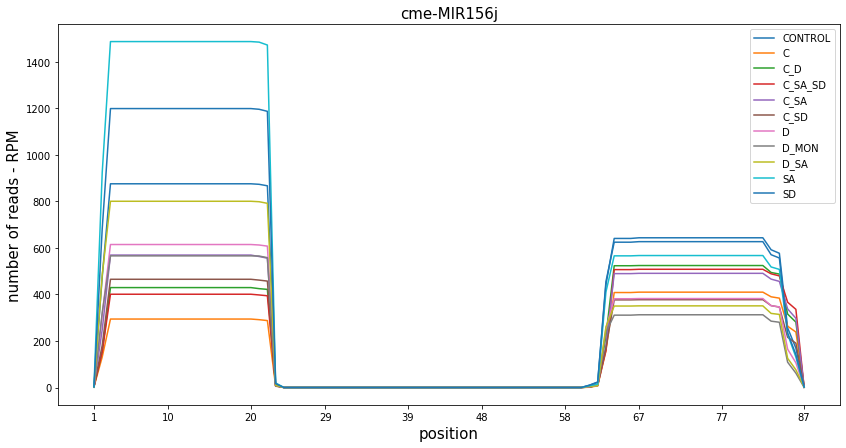

...

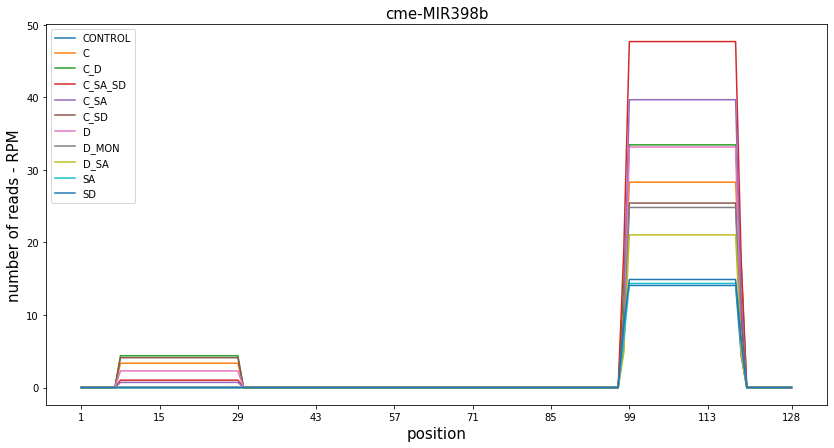

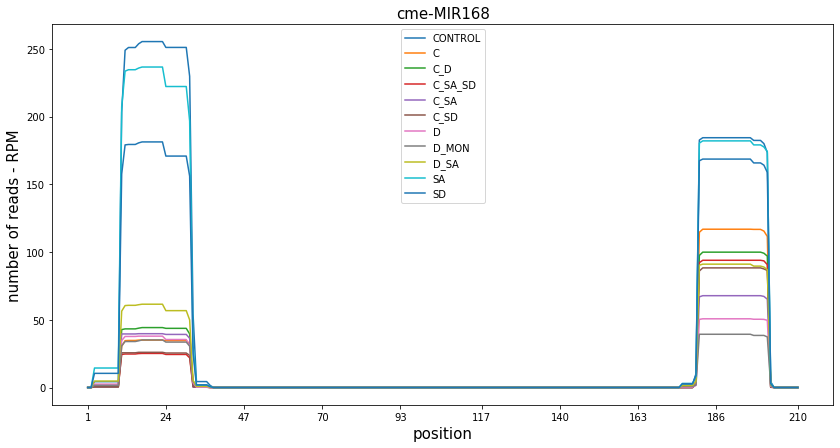

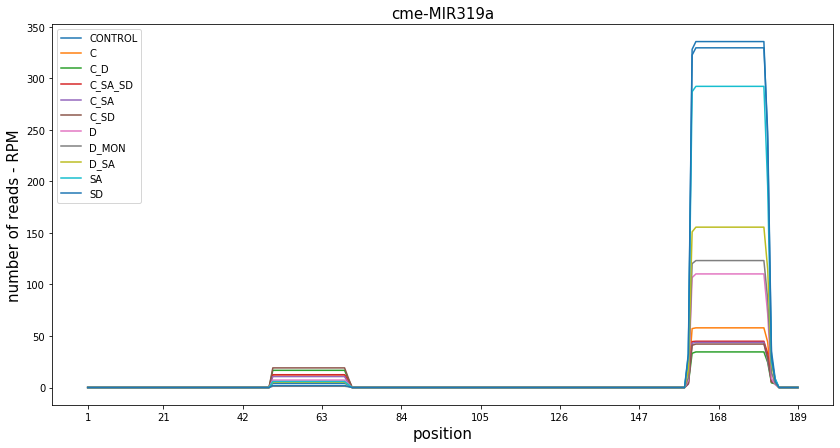

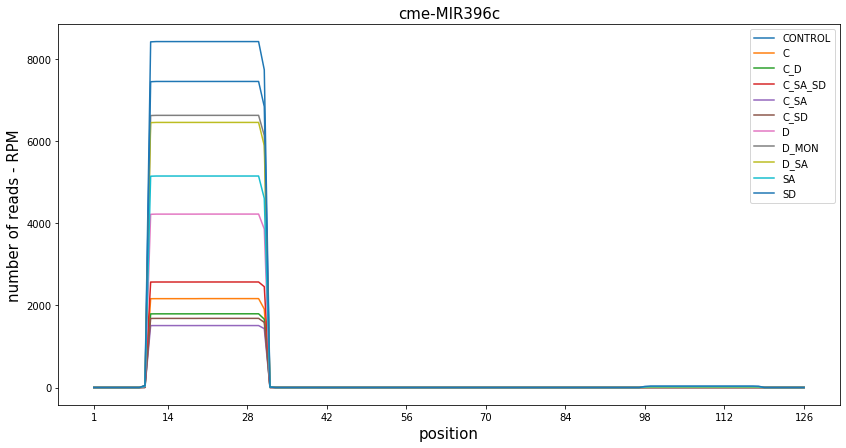

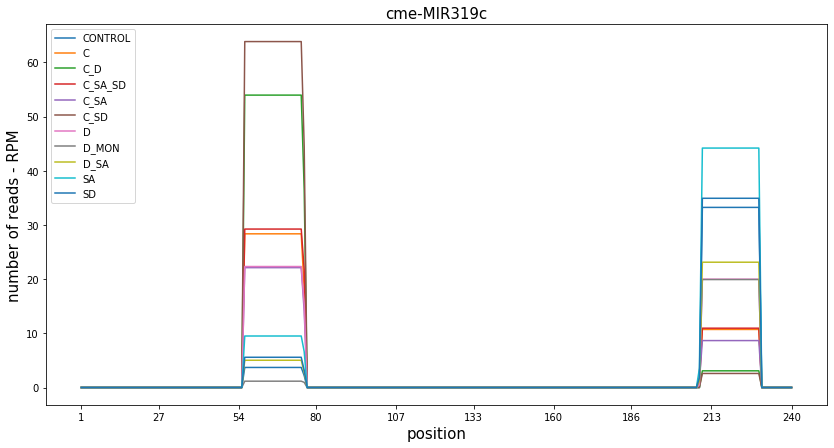

In [41]:
for precursor_cme in list_precursors:
    rows_precursor = set([prec for prec in list(precursor_2_reg['Precursor']) if precursor_cme in prec])
    cmels = precursor_2_reg.loc[precursor_2_reg['Precursor'].isin(rows_precursor)]
    
    length_col = [i for i in range(1, cmels['length prec'].iloc[0]+1)] ## for desde 1 hasta 134 (len prec.)
    column_names = ['CONTROL', 'C', 'C_D', 'C_SA_SD', 'C_SA', 'C_SD', 'D', 'D_MON', 'D_SA', 'SA', 'SD']
    
    base_to_base_prec_dataframe = pd.DataFrame(index=length_col, columns=column_names)
    base_to_base_prec_dataframe = base_to_base_prec_dataframe.fillna(0)

    mean_counts_names = [x for i,x in enumerate(cmels.columns) if 'MEAN' in x]

    mean_counts_names.insert(0,'start')
    mean_counts_names.insert(1,'length seq')
    mean_counts_names

    data = cmels[mean_counts_names]

    new_colnames = [x[5:] for i,x in enumerate(cmels.columns) if 'MEAN' in x]

    mean_counts_names[2:] = new_colnames

    data.columns = mean_counts_names

    try:
        for row in range(len(data)):
            start_pos = int(list(data.iloc[row,:])[0])
            end_pos = start_pos + int(list(data.iloc[row,:])[1])
            for base in range(start_pos, end_pos): 
                # Le resto 1 porque la lista de bases en el df empieza en la posición 0, no 1
                base_to_base_prec_dataframe.iloc[base-1] = base_to_base_prec_dataframe.iloc[base-1].fillna(0) + data.iloc[row][mean_counts_names[2:]].fillna(0)
    except:
        print('%s has given an error indexing in line 29' %precursor_cme)
    base_to_base_prec_dataframe = base_to_base_prec_dataframe.fillna(0) # cambiamos NA por 0

    plt.figure(figsize = (14,7))
    for i in base_to_base_prec_dataframe.columns:
         plt.plot(base_to_base_prec_dataframe.loc[:,i], label = i)
    #plt.plot(base_to_base_prec_dataframe.loc[:,'CONTROL'], label = 'control')
    #plt.plot(base_to_base_prec_dataframe.loc[:,'C_SA_SD'], label = 'C_SA_SD')
    #plt.plot(base_to_base_prec_dataframe.loc[:,'C_SA'], label = 'C_SA')
    plt.title('%s' %precursor_cme, fontsize = 15)
    plt.xlabel('position', fontsize = 15)
    plt.xticks(np.linspace(1,len(base_to_base_prec_dataframe),10, dtype = int))
    plt.ylabel('number of reads - RPM', fontsize = 15)
    #plt.ylim(0,100)
    plt.legend()
    plt.savefig('D://TFM/LLUIS/Results/08-sRNA_hairpin_alignment/T4_plots/estreses_dobles/%s.jpg' %precursor_cme)
    #plt.tight_layout() = base_to_base_prec_dataframe.fillna(0)


### Estreses simples

In [42]:
list_precursors = set(list(precursor_2_reg['Precursor']))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


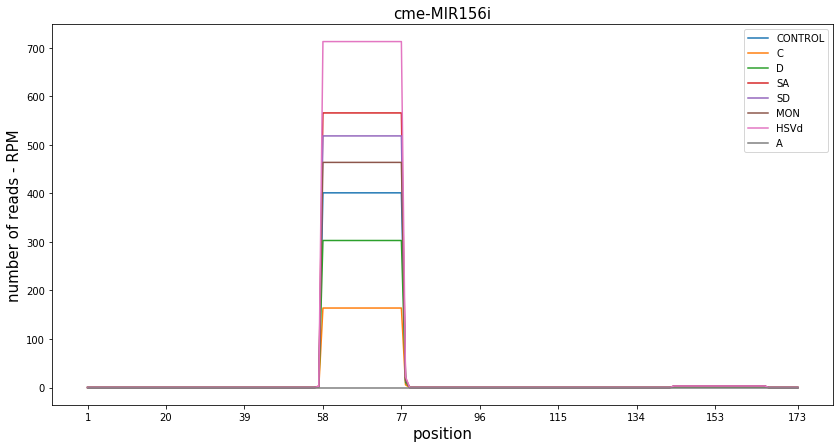

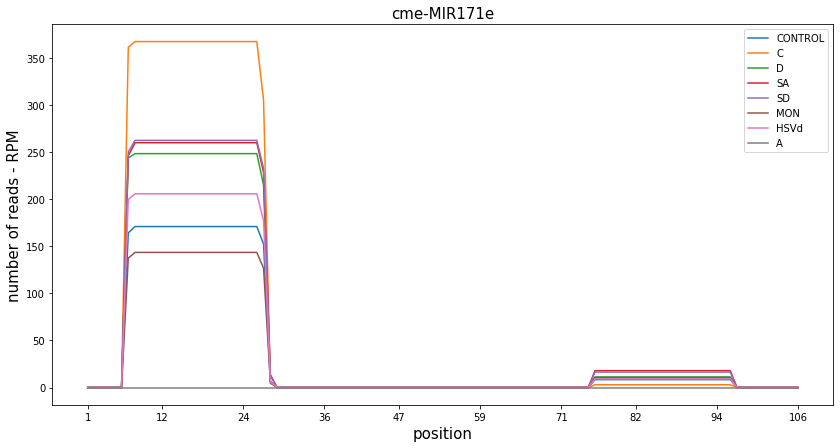

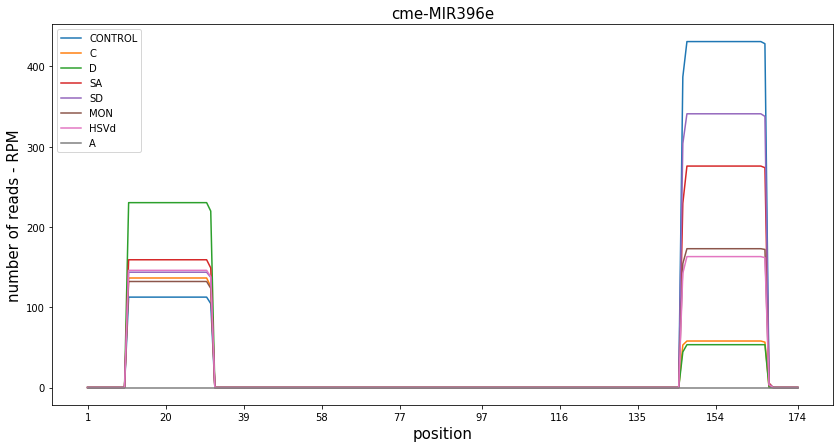

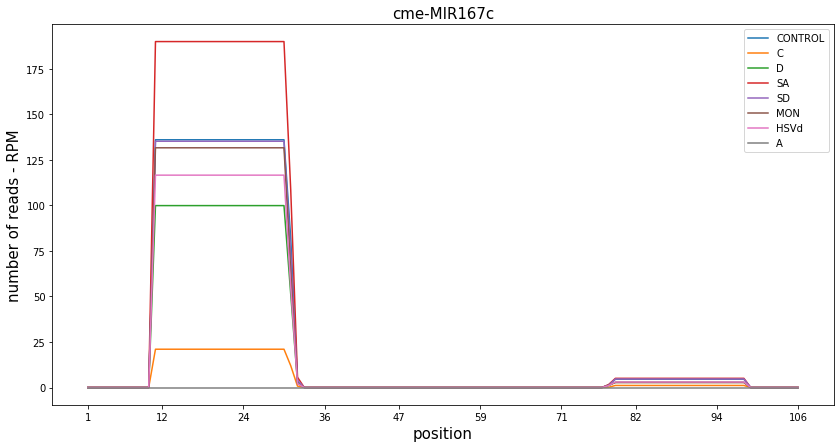

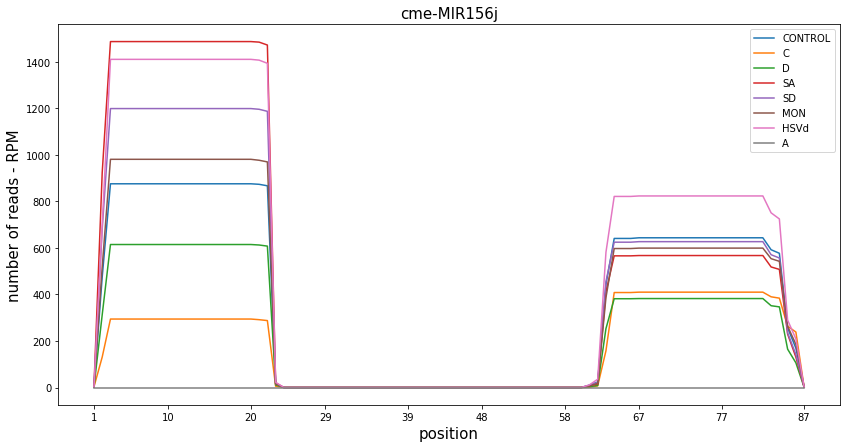

...

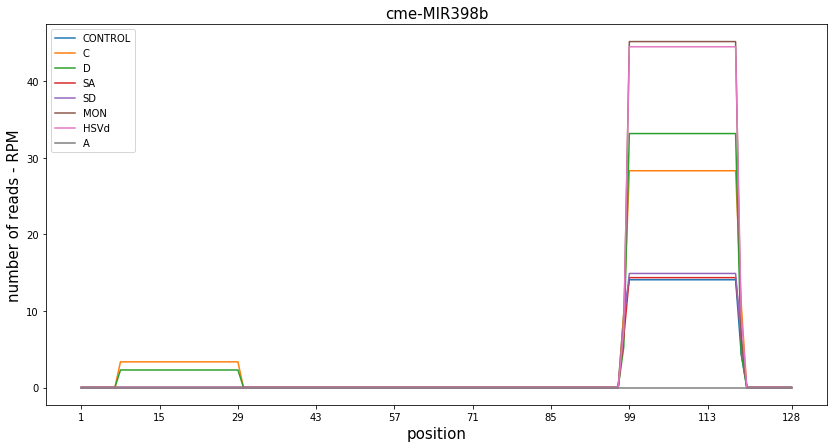

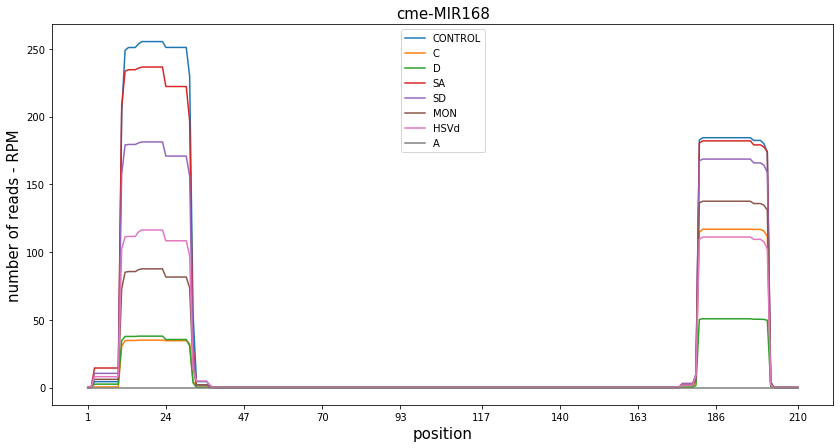

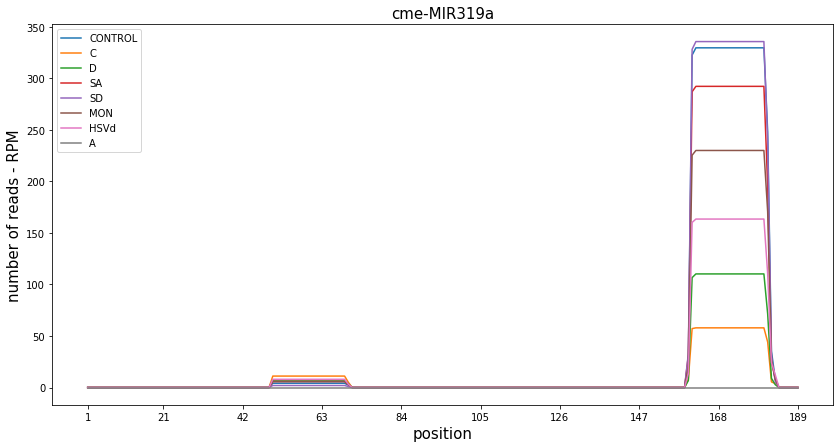

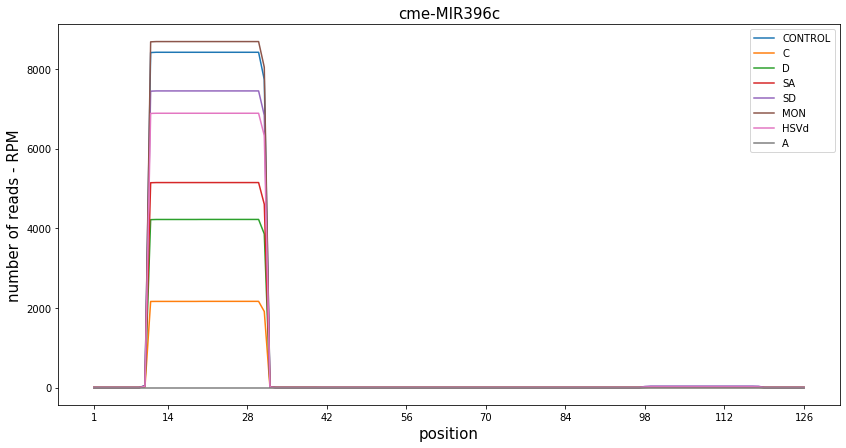

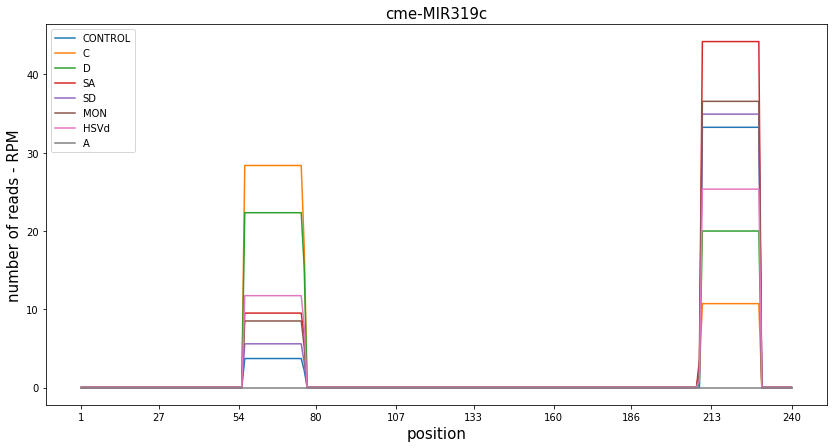

In [43]:
for precursor_cme in list_precursors:
    rows_precursor = set([prec for prec in list(precursor_2_reg['Precursor']) if precursor_cme in prec])
    cmels = precursor_2_reg.loc[precursor_2_reg['Precursor'].isin(rows_precursor)]
    
    length_col = [i for i in range(1, cmels['length prec'].iloc[0]+1)] ## for desde 1 hasta 134 (len prec.)
    column_names = ['CONTROL', 'C', 'D', 'SA', 'SD', 'MON', 'HSVd', 'A']
    
    base_to_base_prec_dataframe = pd.DataFrame(index=length_col, columns=column_names)
    base_to_base_prec_dataframe = base_to_base_prec_dataframe.fillna(0)

    mean_counts_names = [x for i,x in enumerate(cmels.columns) if 'MEAN' in x]

    mean_counts_names.insert(0,'start')
    mean_counts_names.insert(1,'length seq')
    mean_counts_names

    data = cmels[mean_counts_names]

    new_colnames = [x[5:] for i,x in enumerate(cmels.columns) if 'MEAN' in x]

    mean_counts_names[2:] = new_colnames

    data.columns = mean_counts_names

    try:
        for row in range(len(data)):
            start_pos = int(list(data.iloc[row,:])[0])
            end_pos = start_pos + int(list(data.iloc[row,:])[1])
            for base in range(start_pos, end_pos): 
                # Le resto 1 porque la lista de bases en el df empieza en la posición 0, no 1
                base_to_base_prec_dataframe.iloc[base-1] = base_to_base_prec_dataframe.iloc[base-1].fillna(0) + data.iloc[row][mean_counts_names[2:]].fillna(0)
    except:
        print('%s has given an error indexing in line 29' %precursor_cme)
    base_to_base_prec_dataframe = base_to_base_prec_dataframe.fillna(0) # cambiamos NA por 0

    plt.figure(figsize = (14,7))
    for i in base_to_base_prec_dataframe.columns:
         plt.plot(base_to_base_prec_dataframe.loc[:,i], label = i)
    #plt.plot(base_to_base_prec_dataframe.loc[:,'CONTROL'], label = 'control')
    #plt.plot(base_to_base_prec_dataframe.loc[:,'C_SA_SD'], label = 'C_SA_SD')
    #plt.plot(base_to_base_prec_dataframe.loc[:,'C_SA'], label = 'C_SA')
    plt.title('%s' %precursor_cme, fontsize = 15)
    plt.xlabel('position', fontsize = 15)
    plt.xticks(np.linspace(1,len(base_to_base_prec_dataframe),10, dtype = int))
    plt.ylabel('number of reads - RPM', fontsize = 15)
    #plt.ylim(0,100)
    plt.legend()
    plt.savefig('D://TFM/LLUIS/Results/08-sRNA_hairpin_alignment/T4_plots/estreses_simples/%s.jpg' %precursor_cme)


## Sacar gráficas de cada estrés vs control

In [44]:
list_precursors = set(list(precursor_2_reg['Precursor']))

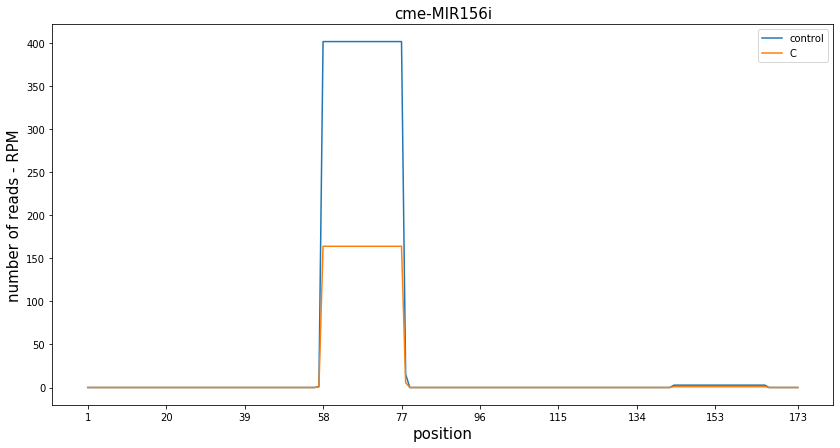

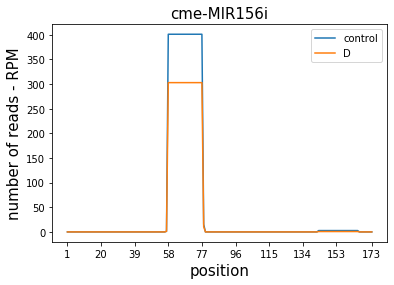

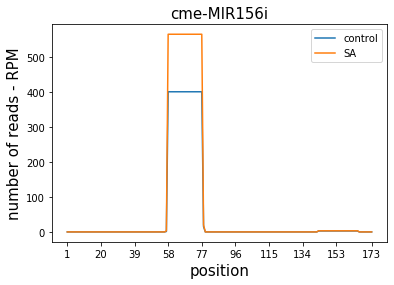

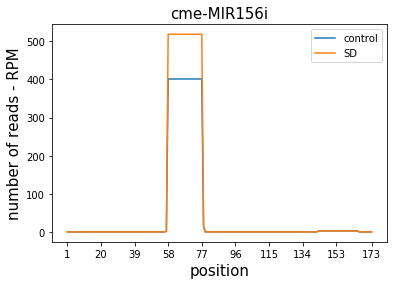

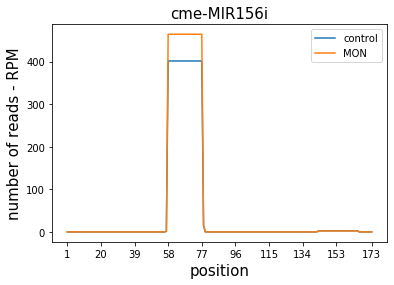

...

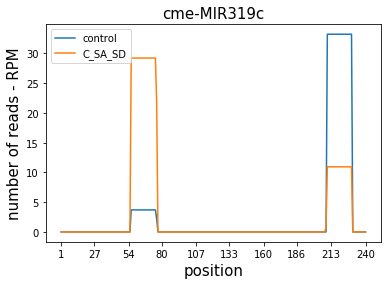

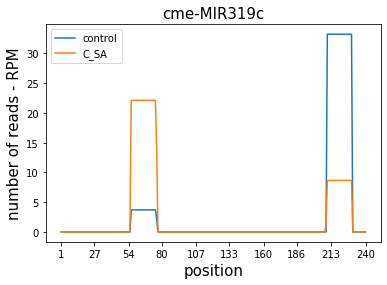

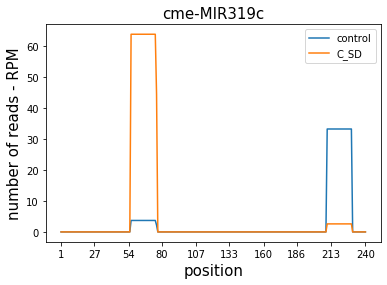

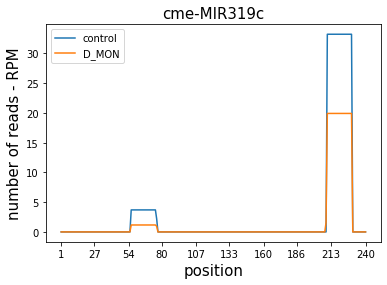

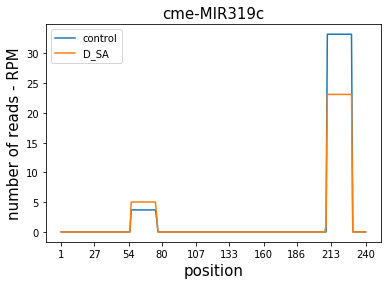

In [45]:
for precursor_cme in list_precursors:
    rows_precursor = set([prec for prec in list(precursor_2_reg['Precursor']) if precursor_cme in prec])
    cmels = precursor_2_reg.loc[precursor_2_reg['Precursor'].isin(rows_precursor)]
    
    length_col = [i for i in range(1, cmels['length prec'].iloc[0]+1)] ## for desde 1 hasta 134 (len prec.)
    column_names = ['CONTROL', 'C', 'D', 'SA', 'SD', 'MON', 'HSVd', 'A',
                    'C_D', 'C_SA_SD', 'C_SA', 'C_SD', 'D_MON', 'D_SA']
    
    base_to_base_prec_dataframe = pd.DataFrame(index=length_col, columns=column_names)
    base_to_base_prec_dataframe = base_to_base_prec_dataframe.fillna(0)

    mean_counts_names = [x for i,x in enumerate(cmels.columns) if 'MEAN' in x]

    mean_counts_names.insert(0,'start')
    mean_counts_names.insert(1,'length seq')
    mean_counts_names

    data = cmels[mean_counts_names]

    new_colnames = [x[5:] for i,x in enumerate(cmels.columns) if 'MEAN' in x]

    mean_counts_names[2:] = new_colnames

    data.columns = mean_counts_names

    try:
        for row in range(len(data)):
            start_pos = int(list(data.iloc[row,:])[0])
            end_pos = start_pos + int(list(data.iloc[row,:])[1])
            for base in range(start_pos, end_pos): 
                # Le resto 1 porque la lista de bases en el df empieza en la posición 0, no 1
                base_to_base_prec_dataframe.iloc[base-1] = base_to_base_prec_dataframe.iloc[base-1].fillna(0) + data.iloc[row][mean_counts_names[2:]].fillna(0)
    except:
        print('%s has given an error indexing in line 29' %precursor_cme)
    base_to_base_prec_dataframe = base_to_base_prec_dataframe.fillna(0) # cambiamos NA por 0

    plt.figure(figsize = (14,7))
    for i in base_to_base_prec_dataframe.columns[1:]:

        plt.plot(base_to_base_prec_dataframe.loc[:,'CONTROL'], label = 'control')
        plt.plot(base_to_base_prec_dataframe.loc[:,i], label = i)
        string_to_plot = str(precursor_cme + '_' + i)
        plt.title('%s' %precursor_cme, fontsize = 15)
        plt.xlabel('position', fontsize = 15)
        plt.xticks(np.linspace(1,len(base_to_base_prec_dataframe),10, dtype = int))
        plt.ylabel('number of reads - RPM', fontsize = 15)
        plt.legend()
        plt.savefig('D://TFM/LLUIS/Results/08-sRNA_hairpin_alignment/T4_plots/estres_vs_control/%s.jpg' %string_to_plot)
        plt.show()

In [46]:
base_to_base_prec_dataframe.columns[1:]

Index(['C', 'D', 'SA', 'SD', 'MON', 'HSVd', 'A', 'C_D', 'C_SA_SD', 'C_SA',
       'C_SD', 'D_MON', 'D_SA'],
      dtype='object')

### Change SNCMels by known miRNA ID

In [48]:
miRBase_IDs = pd.read_csv('D://TFM/LLUIS/Analysis/02-miRBase22/miRBase22_U_to_T.txt', sep = '\t')

In [49]:
miRBase_IDs = miRBase_IDs.rename(index = str, columns={'seq': 'sRNA'})

In [50]:
prec_2_reg_miRBase = pd.merge(miRBase_IDs.iloc[:,0:2], precursor_2_reg, how = 'inner')

In [51]:
prec_2_reg_miRBase = prec_2_reg_miRBase.iloc[:,[0,5]]

In [52]:
precursor_2_reg

,Precursor,start,sRNA,length seq,ID,length prec,A,C,C_D,C_SA_SD,...,HSVd-1,HSVd-2,MEAN-HSVd,HSVd-3,MON-1,MON-2,MEAN-MON,MON-3,%length,5P or 3P
0,cme-MIR396d,10,TTCCACAGCTTTCTTGAACTTT,22,SNCMel000001142,162,NaN,-4.601087,-4.210932,-4.450341,...,6.388640e+14,5.698500e+13,6.218640e+15,8.280370e+14,1.103900e+14,9.110200e+15,9.476520e+15,6.965610e+14,0.0617284,5P
1,cme-MIR396d,10,TTCCACAGCTTTCTTGAACTT,21,SNCMel000003352,162,NaN,-2.875488,-2.776546,-2.712790,...,7.615140e+15,5.031590e+14,6.307830e+15,8.408950e+14,7.951270e+14,7.681010e+14,8.013740e+15,5.443440e+14,0.0617284,5P
2,cme-MIR396d,11,TCCACAGCTTTCTTGAACTT,20,SNCMel000003351,162,NaN,-3.084721,-3.306668,-3.569524,...,6.191630e+14,2.453900e+14,4.290990e+15,5.520250e+14,8.850860e+13,5.245270e+14,6.538790e+15,4.859730e+14,0.0679012,5P
3,cme-MIR396d,9,TTTCCACAGCTTTCTTGAACTT,22,SNCMel000003353,162,NaN,-3.743438,-4.187301,-2.762488,...,8.443130e+15,1.363280e+16,1.494630e+16,2.300100e+14,2.950290e+16,4.417070e+14,3.222490e+16,2.969830e+14,0.0555556,5P
4,cme-MIR396d,132,TCCCACAGCTTTCTTGAACTT,21,SNCMel000003359,162,NaN,-2.571786,-2.020387,-1.873448,...,4.503000e+15,2.617490e+14,3.143110e+16,5.060230e+14,2.335640e+16,2.125710e+16,3.173860e+16,1.754900e+14,0.814815,3P
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280,cme-MIR396e,146,GTTCAATAAAGCTGTGGGAAG,21,SNCMel000024406,174,NaN,-5.799434,-5.516195,-8.286581,...,8.302420e+14,1.063360e+14,1.410560e+16,5.313240e+14,1.841470e+14,2.230620e+14,1.534470e+16,2.915840e+14,0.83908,3P
281,cme-MIR396e,147,TTCAATAAAGCTGTGGGAAGA,21,SNCMel000035654,174,NaN,-3.362217,-4.097092,-4.710342,...,5.065880e+14,3.271870e+14,3.429620e+14,1.840080e+14,3.933710e+14,2.760670e+14,2.844820e+14,4.049770e+16,0.844828,3P
282,cme-MIR396e,146,GTTCAATAAAGCTGTGGGAA,20,SNCMel000037599,174,NaN,-4.418860,-3.874420,-6.883073,...,1.407190e+14,2.726560e+14,1.318720e+15,4.600210e+14,9.834280e+15,1.380330e+14,9.412610e+13,2.699850e+14,0.83908,3P
283,cme-MIR171f,59,TGATTGAGCCGTGCCAATATC,21,SNCMel000026523,89,NaN,-1.887365,NaN,-2.155517,...,5.347320e+14,2.999210e+14,6.467620e+15,3.450160e+14,4.917140e+15,6.073470e+15,4.813590e+15,8.639520e+14,0.662921,3P


In [53]:
for RNA in set(precursor_2_reg['ID']):
    if RNA in set(prec_2_reg_miRBase.iloc[:,1]):
        indeces = [i for i, x in enumerate(list(precursor_2_reg['ID'])) if x == RNA]
        print(indeces)
        
        indeces_mirbase = [i for i,x in enumerate(list(prec_2_reg_miRBase.iloc[:,1])) if x == RNA]
        try:
            precursor_2_reg.loc[indeces,'ID'] = list(prec_2_reg_miRBase.iloc[indeces_mirbase,0])
        except:
            pass

[85, 105, 182, 194, 243]
[77, 176]
[83, 104, 180, 193, 242]
[125]
[255]
[100]
[209]
[128, 280]
[251]
[130, 282]
[30, 56, 237]
[116]
[134]
[67]
[275]
[58]
[68]
[208]
[122]
[74]
[277]
[256]
[137]
[71]
[135, 200, 201, 204, 205]
[144]
[51]
[90]
[215]
[113]
[155]
[239]
[57, 249, 273]
[139]
[73]
[47]
[55]
[276]
[72]
[114]
[136, 202, 206]
[224]
[232]
[248]
[50]
[52]
[145]
[210]
[41]
[25, 64]
[6, 35, 123, 222]
[252]
[264]
[106, 195, 244]
[115]
[59]
[212]
[127, 279]
[79]
[11, 189, 271]
[283]
[225]
[261]
[131]
[20, 229]
[24, 54, 63, 234]
[103, 192, 241]
[1, 31, 218]
[246, 268]
[267]
[278]
[94]


In [54]:
## Write the table
precursor_2_reg.to_csv('D://TFM/LLUIS/Results/08-sRNA_hairpin_alignment/tablas/20_01_09_precursors_2_regions.csv', 
                       index = None)